In [1]:
from statsbombpy import sb
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from mplsoccer import Pitch
import numpy as np
import seaborn as sns
import import_ipynb
from src import helpers

In [2]:
#Get all UEFA EURO 2025 matches
matches = sb.matches(season_id=315,competition_id=53)

spain_matches = matches[
    (matches['home_team'] == "Spain Women's") | (matches['away_team'] == "Spain Women's")
].copy()

spain_matches[['match_id', 'home_team', 'away_team', 'match_date']]

,match_id,home_team,away_team,match_date
0,4020846,England Women's,Spain Women's,2025-07-27
1,4020077,Germany Women's,Spain Women's,2025-07-23
4,4018356,Spain Women's,Switzerland Women's,2025-07-18
11,3998855,Italy Women's,Spain Women's,2025-07-11
20,3998847,Spain Women's,Belgium Women's,2025-07-07
27,3998839,Spain Women's,Portugal Women's,2025-07-03


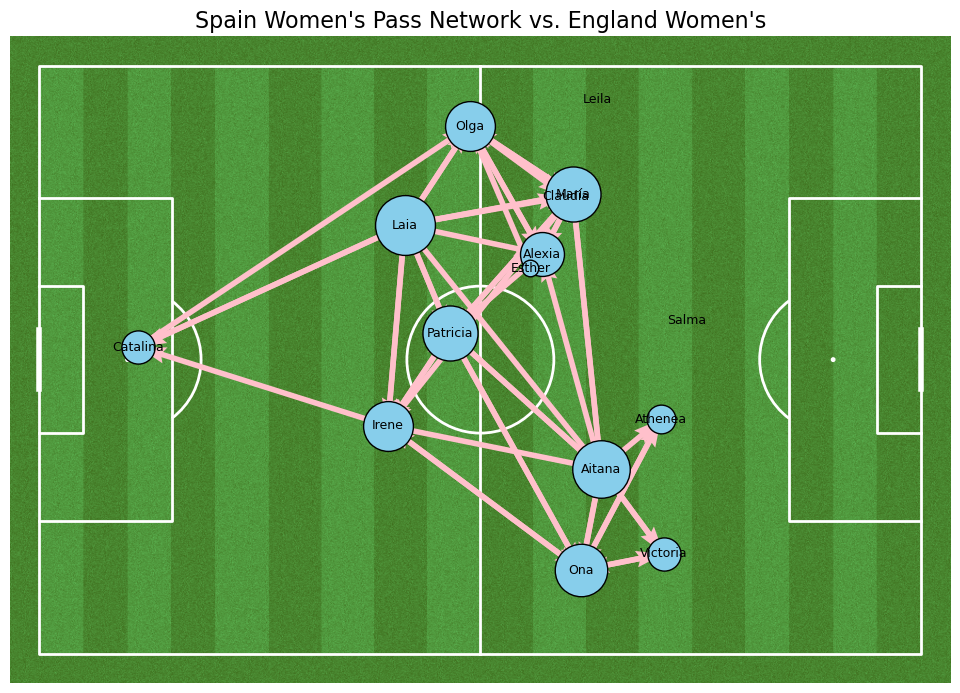


Top 5 players by degree centrality vs. England Women's:
1. Laia Aleixandri López: 0.929
2. Aitana Bonmati Conca: 0.857
3. Patricia Guijarro Gutiérrez: 0.786
4. María Francesca Caldentey Oliver: 0.786
5. Ona Batlle Pascual: 0.714


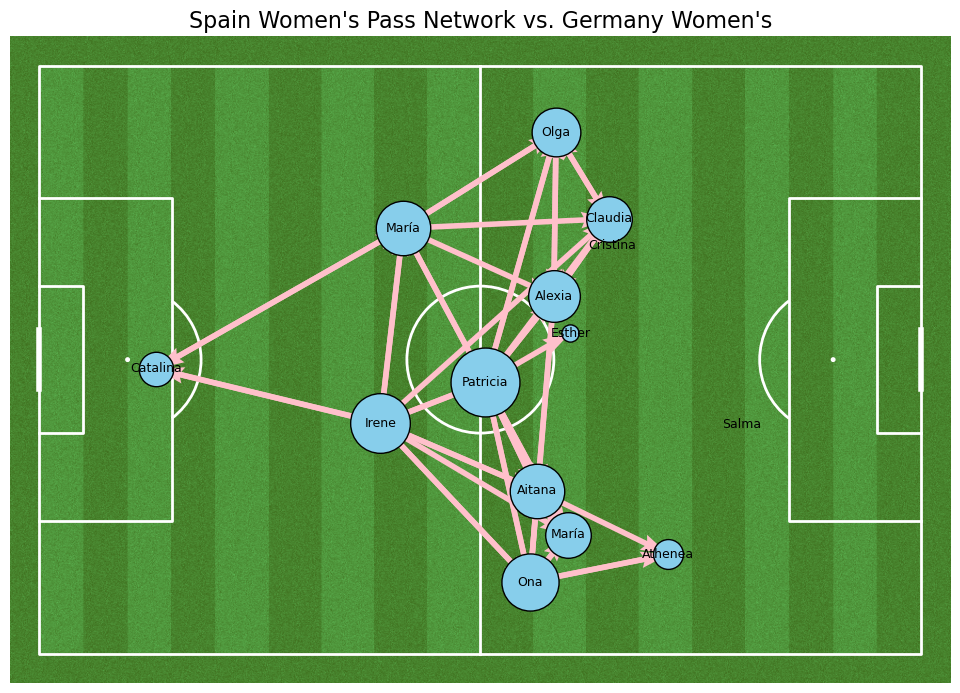


Top 5 players by degree centrality vs. Germany Women's:
1. Patricia Guijarro Gutiérrez: 1.231
2. Irene Paredes Hernandez: 0.923
3. Ona Batlle Pascual: 0.846
4. Aitana Bonmati Conca: 0.769
5. María Méndez Fernández: 0.769


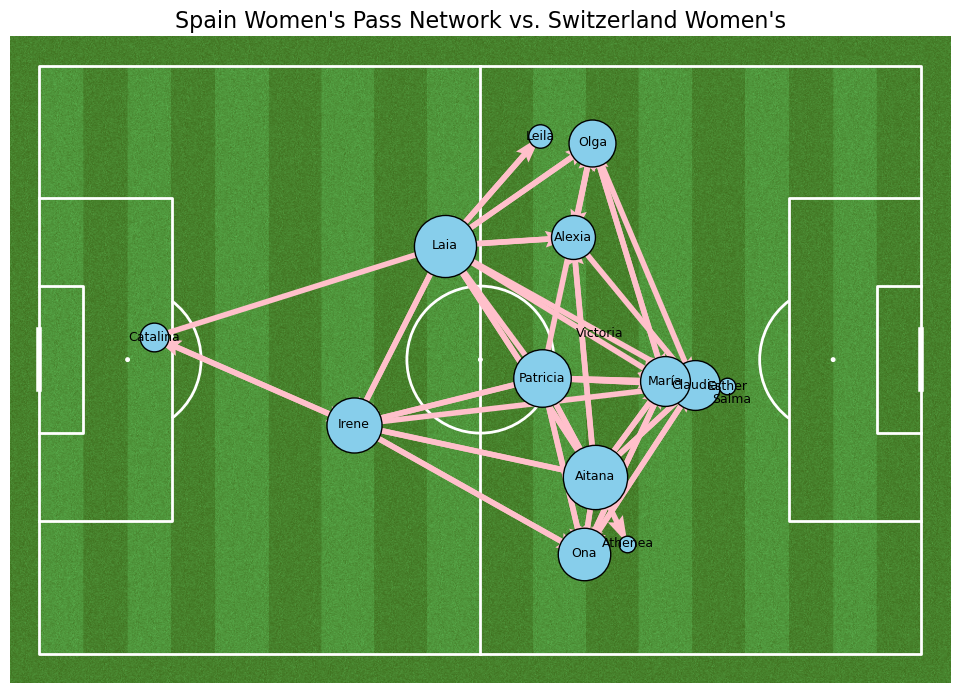


Top 5 players by degree centrality vs. Switzerland Women's:
1. Aitana Bonmati Conca: 1.071
2. Laia Aleixandri López: 1.000
3. Patricia Guijarro Gutiérrez: 0.857
4. Irene Paredes Hernandez: 0.786
5. Ona Batlle Pascual: 0.714


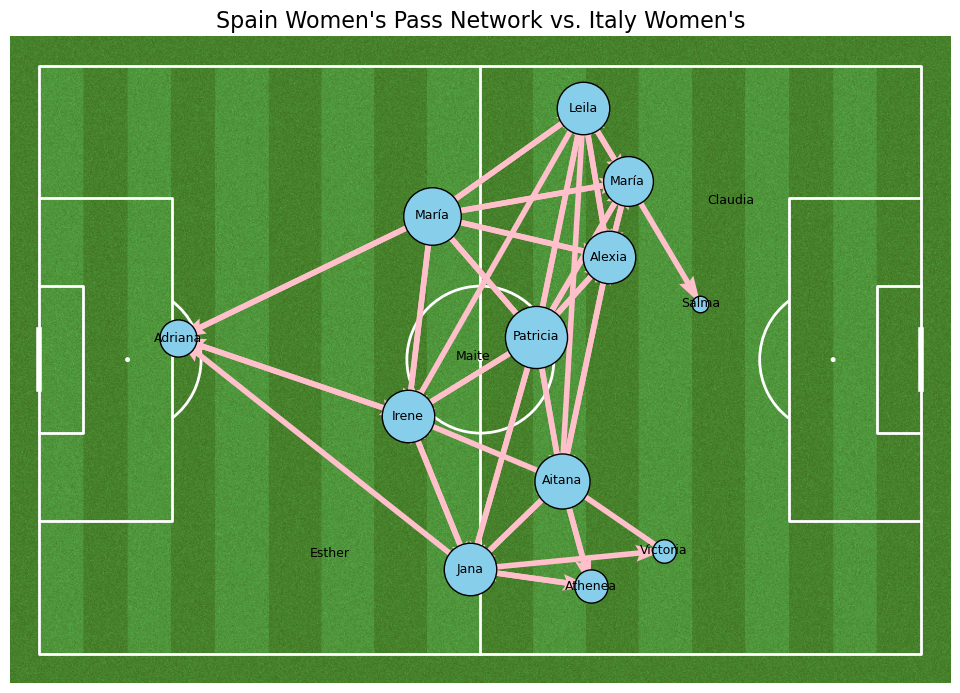


Top 5 players by degree centrality vs. Italy Women's:
1. Patricia Guijarro Gutiérrez: 1.000
2. María Méndez Fernández: 0.857
3. Aitana Bonmati Conca: 0.786
4. Irene Paredes Hernandez: 0.714
5. Jana Fernandez Velasco: 0.714


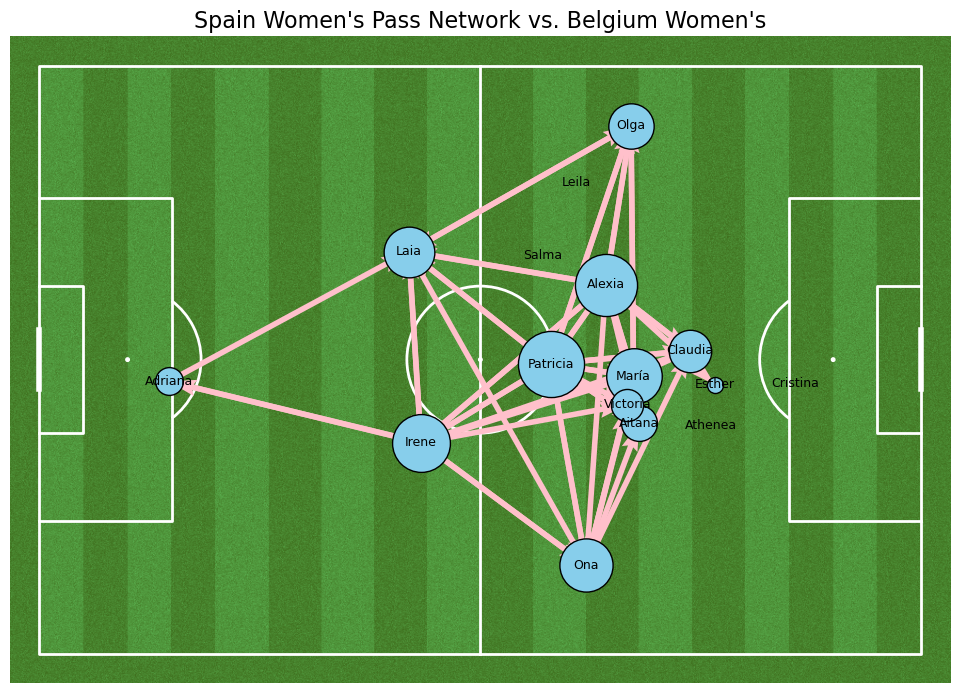


Top 5 players by degree centrality vs. Belgium Women's:
1. Patricia Guijarro Gutiérrez: 1.133
2. Alexia Putellas Segura: 1.000
3. Irene Paredes Hernandez: 0.867
4. María Francesca Caldentey Oliver: 0.800
5. Ona Batlle Pascual: 0.733


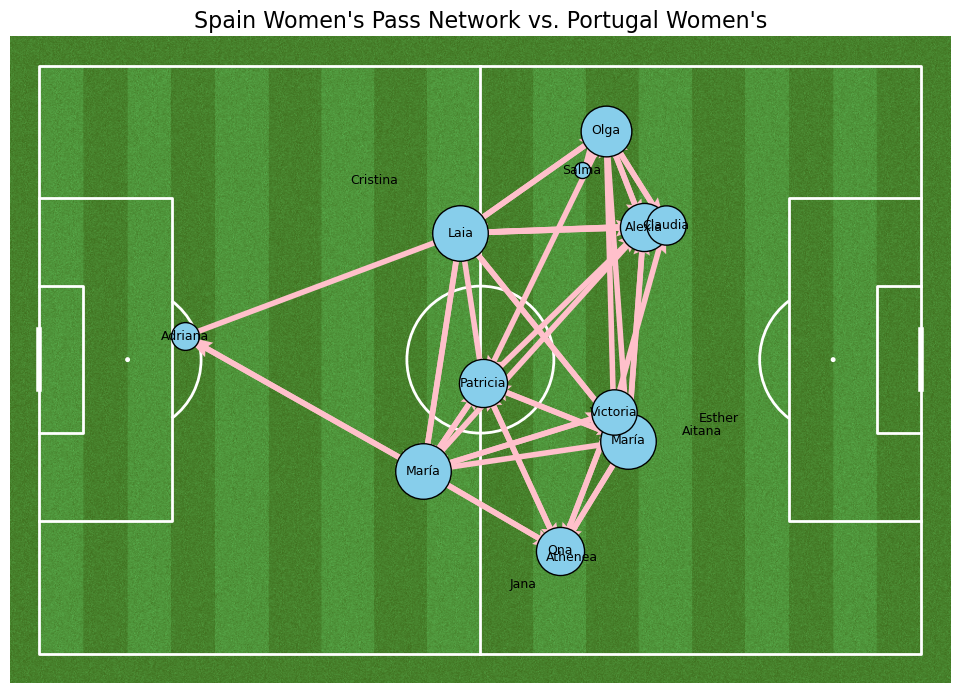


Top 5 players by degree centrality vs. Portugal Women's:
1. María Méndez Fernández: 0.800
2. Laia Aleixandri López: 0.800
3. María Francesca Caldentey Oliver: 0.800
4. Olga  Carmona García: 0.667
5. Alexia Putellas Segura: 0.600


In [3]:
centrality_records = []

for _, row in spain_matches.iterrows():
    match_id = row['match_id']
    team = "Spain Women's"
    opp_team = row['home_team'] if row['home_team'] != team else row['away_team']
    date = pd.to_datetime(row['match_date'])
    centrality = helpers.plot_pass_network(match_id,team)

    for player, score in centrality.items():
        centrality_records.append({
            'match_id': match_id,
            'date': date,
            'opponent': opp_team,
            'player': player,
            'degree_centrality': score
        })


In [4]:
euro_final_match_id = spain_matches.iloc[0,0]

events = sb.events(match_id=euro_final_match_id)
spain_events = events[(events['team'] == "Spain Women's") & (events['minute']<120)].copy().reset_index(drop=True)

spain_events['type'].value_counts()

type
Pass                 817
Ball Receipt*        722
Carry                674
Pressure             253
Ball Recovery         81
Clearance             45
Duel                  36
Block                 23
Shot                  23
Interception          20
Dribble               19
Foul Won              18
Miscontrol            16
Goal Keeper           12
Foul Committed        11
Dispossessed          10
Injury Stoppage        6
Half Start             4
Dribbled Past          4
Substitution           4
Half End               3
Tactical Shift         2
50/50                  1
Shield                 1
Referee Ball-Drop      1
Error                  1
Starting XI            1
Name: count, dtype: int64

In [5]:
# Filter to only Spain passes
spain_passes = events[
    (events['team'] == "Spain Women's") &
    (events['type'] == 'Pass') &
    (events['pass_outcome'].isna()) &
    (events['pass_type'] != 'Throw-In') &
    (events['minute']<=120)
].copy()

# Filter to Spain's shots with xG
spain_shots = events[
    (events['team'] == "Spain Women's") &
    (events['type'] == "Shot") &
    (events['shot_statsbomb_xg'].notna() &
    (events['minute']<=120))
][['id', 'possession', 'shot_statsbomb_xg']]

spain_shots.head()

,id,possession,shot_statsbomb_xg
4586,75ada573-a8f2-4211-8eba-08cffb7209e5,23,0.130437
4587,4b836bc7-fa66-44f0-ba02-70d97eb16f40,24,0.102305
4588,b6344acc-b333-4b4f-8e0c-ef79fe08a1a1,28,0.067261
4591,e34676c8-6d54-4ce7-8daf-dd6fa65650f5,44,0.052309
4592,19fe6b40-71be-42f7-b00f-fac90afaf811,51,0.395652


In [6]:
# Get list of possession IDs where Spain took shots
possessions_with_shots = spain_shots['possession'].unique()

# Keep only passes that occurred during those shot possessions
build_up_passes = spain_passes[spain_passes['possession'].isin(possessions_with_shots)].copy()

In [7]:
build_up_passes = build_up_passes[['player', 'pass_recipient', 'location', 'pass_end_location','possession','index','pass_shot_assist','minute']]
build_up_passes[['x', 'y']] = pd.DataFrame(build_up_passes['location'].tolist(), index=build_up_passes.index)
build_up_passes[['end_x', 'end_y']] = pd.DataFrame(build_up_passes['pass_end_location'].tolist(), index=build_up_passes.index)

build_up_passes.head()

,player,pass_recipient,location,pass_end_location,possession,index,pass_shot_assist,minute,x,y,end_x,end_y
126,Ona Batlle Pascual,Catalina Thomas Coll Lluch,"[33.6, 54.3]","[11.7, 44.6]",23,384,NaN,8,33.6,54.3,11.7,44.6
127,Catalina Thomas Coll Lluch,Laia Aleixandri López,"[17.5, 41.0]","[31.6, 15.5]",23,387,NaN,8,17.5,41.0,31.6,15.5
128,Laia Aleixandri López,Olga Carmona García,"[60.0, 7.6]","[83.4, 5.1]",23,391,NaN,8,60.0,7.6,83.4,5.1
129,Olga Carmona García,Esther Gonzalez Rodríguez,"[90.6, 4.5]","[107.4, 29.9]",23,394,True,8,90.6,4.5,107.4,29.9
132,Catalina Thomas Coll Lluch,Ona Batlle Pascual,"[40.8, 6.5]","[45.9, 18.6]",24,407,NaN,9,40.8,6.5,45.9,18.6


In [8]:
# Build lookup: possession → xG value of shot
shot_xg_map = spain_shots.set_index('possession')['shot_statsbomb_xg'].to_dict()

sorted_xg_map = dict(sorted(shot_xg_map.items(), key=lambda item: item[1],reverse=True))

sorted_xg_map

{198: 0.4002116,
 51: 0.39565173,
 23: 0.13043691,
 24: 0.102304906,
 213: 0.10162451,
 97: 0.09936041,
 210: 0.08461461,
 137: 0.08416592,
 72: 0.071709156,
 104: 0.069629654,
 28: 0.06726146,
 92: 0.06397601,
 168: 0.063361704,
 164: 0.056714322,
 183: 0.05549369,
 186: 0.05386765,
 113: 0.053009905,
 44: 0.05230889,
 116: 0.04057705,
 163: 0.028666293,
 69: 0.028371284,
 126: 0.019895604,
 165: 0.0127668}

In [9]:
# Get high xG possessions
important_poss = [poss[0] for poss in sorted_xg_map.items() if (poss[1]>=0.2) ]

important_poss

[198, 51]

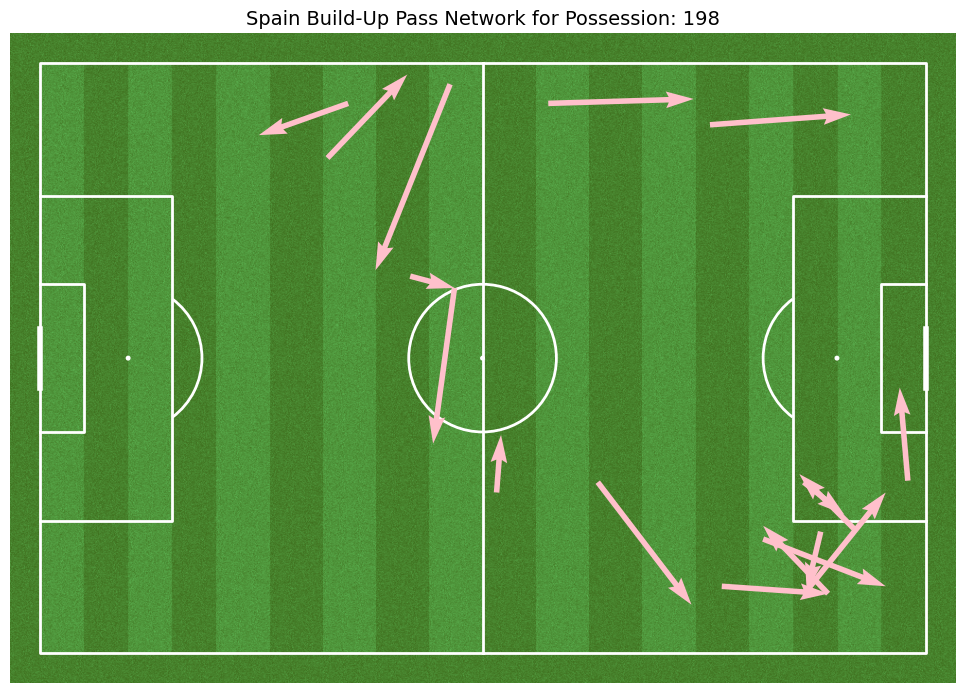

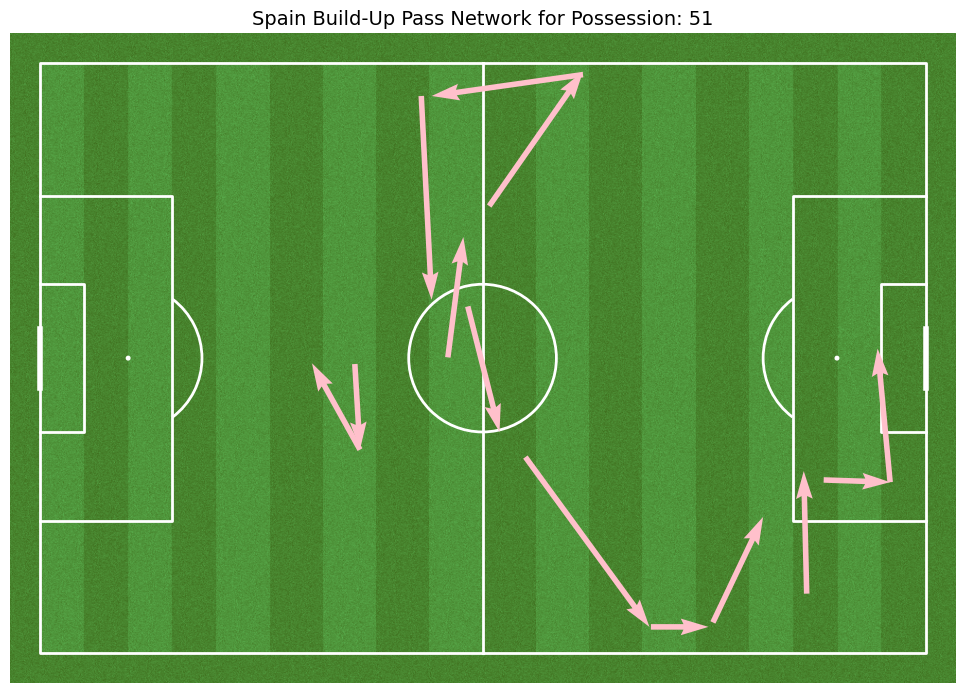

In [10]:
# Build lookup: possession → xG value of shot
build_up_passes['xg_value'] = build_up_passes['possession'].map(shot_xg_map)

for poss_id in important_poss:

    poss_passes = build_up_passes[build_up_passes['possession']==poss_id].sort_values('index')
    
    # Create the pitch
    pitch = Pitch(pitch_color='grass',line_color='white',stripe=True)
    fig, ax = pitch.draw(figsize=(10, 7))
    
    # Plot all arrows at once using pitch.arrows()
    pitch.arrows(
        poss_passes['x'], poss_passes['y'],
        poss_passes['end_x'], poss_passes['end_y'],
        color='Pink',
        ax=ax
    )
    
    # Add title
    ax.set_title(f"Spain Build-Up Pass Network for Possession: {poss_id}", fontsize=14)
    plt.show()

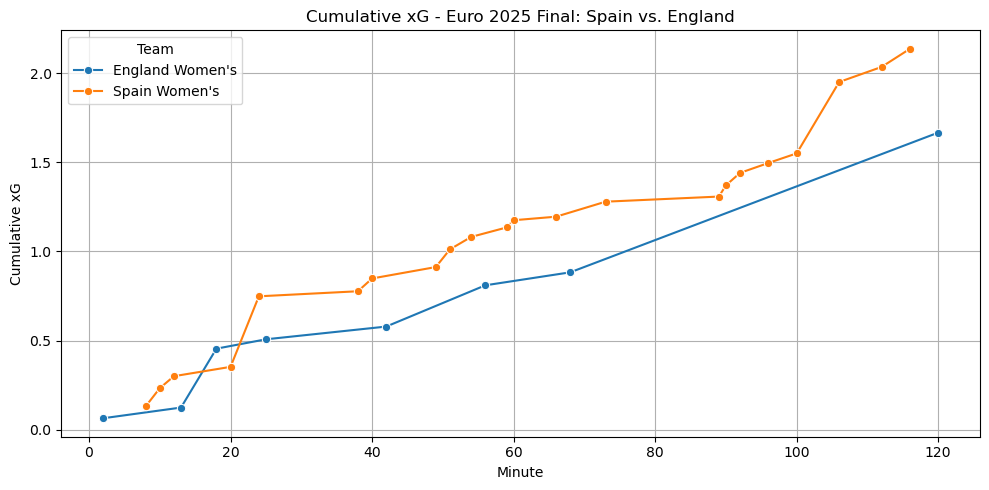

In [11]:
# 1. Get all shots with xG
all_shots = events[
    (events['type'] == 'Shot') &
    (events['shot_statsbomb_xg'].notna())
][['team', 'minute', 'shot_statsbomb_xg']]

# 2. Sort and compute cumulative xG by team
all_shots = all_shots.sort_values('minute')
regulation_shots = all_shots.loc[all_shots['minute']<=120].copy()
regulation_shots['cumulative_xg'] = regulation_shots.groupby('team')['shot_statsbomb_xg'].cumsum()

# 3. Plot
plt.figure(figsize=(10, 5))
sns.lineplot(data=regulation_shots, x='minute', y='cumulative_xg', hue='team', marker='o')

# 4. Formatting
plt.title("Cumulative xG - Euro 2025 Final: Spain vs. England")
plt.xlabel("Minute")
plt.ylabel("Cumulative xG")
plt.legend(title="Team")
plt.grid(True)
plt.tight_layout()
plt.show()

In [12]:
shots = events[(events['type']=='Shot') & (events['shot_statsbomb_xg'].notna() & (events['minute']<120))]
xg_df = helpers.compute_xg_chain_and_buildup(events,shots)

xg_df

,team,xGChain,xGBuildup
Lauren Hemp,England Women's,0.403319,0.073069
Aitana Bonmati Conca,Spain Women's,0.307577,0.199404
Ona Batlle Pascual,Spain Women's,0.268994,0.130279
Irene Paredes Hernandez,Spain Women's,0.217086,0.181746
Laia Aleixandri López,Spain Women's,0.212763,0.212763
María Francesca Caldentey Oliver,Spain Women's,0.202444,0.099071
Olga Carmona García,Spain Women's,0.173006,0.131417
Athenea del Castillo Belvide,Spain Women's,0.143267,0.114234
Patricia Guijarro Gutiérrez,Spain Women's,0.131424,0.120055
Claudia Pina Medina,Spain Women's,0.106267,0.062672


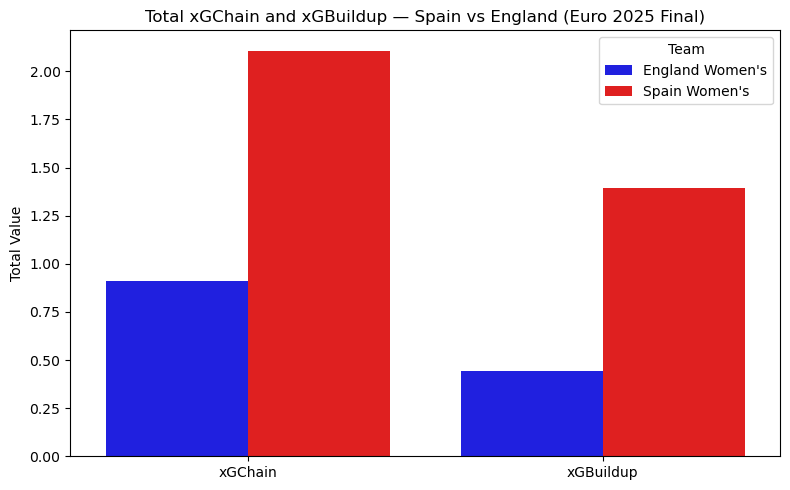

In [13]:
# Group by team and sum each metric
team_summary = xg_df.groupby('team')[['xGChain', 'xGBuildup']].sum().reset_index()

# Melt for long format
melted = team_summary.melt(id_vars='team', 
                           value_vars=['xGChain', 'xGBuildup'], 
                           var_name='Metric', 
                           value_name='Total')

# Set color palette manually
colors = {"Spain Women's": 'red', "England Women's": 'blue'}

plt.figure(figsize=(8, 5))
sns.barplot(data=melted, x='Metric', y='Total', hue='team', palette=colors)

plt.title('Total xGChain and xGBuildup — Spain vs England (Euro 2025 Final)')
plt.ylabel('Total Value')
plt.xlabel('')
plt.legend(title='Team')
plt.tight_layout()
plt.show()

In [14]:
spain_centrality_df = pd.DataFrame.from_dict(helpers.plot_pass_network(4020846,"Spain Women's",3,show_plot=False),orient='index')
england_centrality_df = pd.DataFrame.from_dict(helpers.plot_pass_network(4020846,"England Women's",3,show_plot=False),orient='index')


Top 5 players by degree centrality vs. England Women's:
1. Aitana Bonmati Conca: 1.286
2. Patricia Guijarro Gutiérrez: 1.214
3. Laia Aleixandri López: 1.143
4. María Francesca Caldentey Oliver: 1.143
5. Olga  Carmona García: 1.000

Top 5 players by degree centrality vs. Spain Women's:
1. Lucy Bronze: 0.667
2. Leah Williamson: 0.667
3. Alex Greenwood: 0.667
4. Georgia Stanway: 0.600
5. Jessica Carter: 0.600


In [15]:
spain_df = pd.merge(xg_df,spain_centrality_df,how='inner',left_index=True,right_index=True).rename({0:'Degree Centrality'},axis=1)

england_df = pd.merge(xg_df,england_centrality_df,how='inner',left_index=True,right_index=True).rename({0:'Degree Centrality'},axis=1)

spain_df['team'] = 'Spain'
england_df['team'] = 'England'

combined_df = pd.concat([spain_df, england_df]).reset_index().rename({'index':'Player'},axis=1)
#combined_df = combined_df.iloc[:,1:].sort_values('xGChain', ascending=False).reset_index(drop=True)

combined_df


,Player,team,xGChain,xGBuildup,Degree Centrality
0,Aitana Bonmati Conca,Spain,0.307577,0.199404,1.285714
1,Ona Batlle Pascual,Spain,0.268994,0.130279,0.928571
2,Irene Paredes Hernandez,Spain,0.217086,0.181746,0.857143
3,Laia Aleixandri López,Spain,0.212763,0.212763,1.142857
4,María Francesca Caldentey Oliver,Spain,0.202444,0.099071,1.142857
5,Olga Carmona García,Spain,0.173006,0.131417,1.000000
6,Athenea del Castillo Belvide,Spain,0.143267,0.114234,0.500000
7,Patricia Guijarro Gutiérrez,Spain,0.131424,0.120055,1.214286
8,Claudia Pina Medina,Spain,0.106267,0.062672,0.500000
9,Alexia Putellas Segura,Spain,0.091547,0.033882,0.785714


In [21]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import plotly.express as px
import plotly.graph_objects as go

# Prepare data
X = combined_df[['Degree Centrality']]  # 2D array for sklearn
y = combined_df['xGChain']

# Fit regression model
model = LinearRegression().fit(X, y)
y_pred = model.predict(X)

#Correlation coefficient
correlation = combined_df['Degree Centrality'].corr(combined_df['xGChain'])

# R^2 score
r2 = r2_score(y, y_pred)

correlation = combined_df['Degree Centrality'].corr(combined_df['xGChain'])

# Create interactive scatterplot
fig = px.scatter(
    combined_df,
    x='Degree Centrality',
    y='xGChain',
    color='team',
    color_discrete_map={"Spain Women's": 'red', "England Women's": 'blue'},
    hover_name='Player',
    hover_data={
        'Degree Centrality': ':.3f',
        'xGChain': ':.3f',
        'team': False
    },
    labels={
        'centrality': 'Degree Centrality',
        'xGChain': 'xGChain'
    }
)

fig.update_traces(marker=dict(size=12, line=dict(width=1, color='black')))

fig.add_trace(
    go.Scatter(
    x=combined_df['Degree Centrality'],
    y=y_pred,
    mode='lines',
    name='Regression Line',
    line=dict(color='black', width=2)
    )
)

fig.update_layout(
    title=dict(
        text='Centrality vs xGChain<br><sup>UEFA Euro 2025 Final: Spain vs England</sup>',
        x=0.5,
        font=dict(size=22)
    ),
    xaxis=dict(title='Degree Centrality', showgrid=True),
    yaxis=dict(title='xGChain', showgrid=True),
    legend=dict(
        title='',
        x=1.2,   # Almost at the far right
        y=1,   # Mid-to-top (1 = top)
        xanchor='right',
        yanchor='top',
        bgcolor='rgba(255, 255, 255, 0.8)',
        bordercolor='black',
        borderwidth=1,
        font=dict(size=12)
    ),
    template='simple_white',
    width=900,
    height=550
)

fig.show()


print(f"The correlation between degree centrality and xGChain is:{correlation}")
print(f"The R squared value is:{r2}")


The correlation between degree centrality and xGChain is:0.5538600842572735
The R squared value is:0.30676099293347414


In [17]:
centrality_df = pd.DataFrame(centrality_records)
xg_records = []
for _, row in spain_matches.iterrows():
    match_id = row['match_id']
    events = sb.events(match_id=match_id)
    shots = events[(events['type']=='Shot') & (events['shot_statsbomb_xg'].notna())]

    xg_df = helpers.compute_xg_chain_and_buildup(events,shots)
    xg_df['match_id'] = match_id
    xg_df['player'] = xg_df.index
    xg_records.append(xg_df)

xg_all = pd.concat(xg_records,ignore_index=True)

full_df = pd.merge(centrality_df,xg_all,on=['match_id','player'],how='outer')

full_df = full_df[(full_df['degree_centrality'].notna())]

full_df


,match_id,date,opponent,player,degree_centrality,team,xGChain,xGBuildup
0,3998839,2025-07-03,Portugal Women's,Adriana Nanclares Romero,0.200000,Spain Women's,0.043354,0.043354
1,3998839,2025-07-03,Portugal Women's,Aitana Bonmati Conca,0.000000,Spain Women's,0.088590,0.001232
2,3998839,2025-07-03,Portugal Women's,Alexia Putellas Segura,0.600000,Spain Women's,0.584065,0.268168
9,3998839,2025-07-03,Portugal Women's,Athenea del Castillo Belvide,0.066667,Spain Women's,0.030188,0.013730
13,3998839,2025-07-03,Portugal Women's,Claudia Pina Medina,0.400000,Spain Women's,0.296334,0.237956
...,...,...,...,...,...,...,...,...
165,4020846,2025-07-27,England Women's,Olga Carmona García,0.642857,Spain Women's,0.173006,0.131417
166,4020846,2025-07-27,England Women's,Ona Batlle Pascual,0.714286,Spain Women's,0.268994,0.130279
167,4020846,2025-07-27,England Women's,Patricia Guijarro Gutiérrez,0.785714,Spain Women's,0.914924,0.120055
168,4020846,2025-07-27,England Women's,Salma Paralluelo Ayingono,0.000000,Spain Women's,0.816217,0.002134


In [18]:
plot_df = full_df[['opponent','player','degree_centrality','xGChain']].copy()

fig = px.scatter(
    plot_df,
    x='degree_centrality',
    y='xGChain',
    color='opponent',  # All Spain players
    hover_name='player',
    hover_data={
        'degree_centrality': ':.3f',
        'xGChain': ':.3f',
        'opponent': True
    },
    title='Degree Centrality vs xGChain — Spain (Euro 2025)',
)

# Add regression line (one line across all players)
import statsmodels.api as sm
X = plot_df['degree_centrality']
y = plot_df['xGChain']
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()
plot_df['regression_line'] = model.predict(X_with_const)

fig.add_traces(px.line(plot_df, x='degree_centrality', y='regression_line').data)

fig.update_traces(marker=dict(size=10, line=dict(width=1, color='black')))
fig.update_layout(
    xaxis_title='Degree Centrality',
    yaxis_title='xGChain',
    legend=dict(title=''),
    margin=dict(l=40, r=40, t=60, b=40),
    title_x = 0.5
)

fig.show()

In [51]:
# Average values across matches
avg_df = plot_df.groupby('player')[['degree_centrality', 'xGChain']].mean()

#Filter out players whose degree centrality is 0
filtered_df = avg_df.loc[avg_df['degree_centrality']>0].copy()

# Flag players who overperform in xGChain vs their centrality
filtered_df['efficiency'] = filtered_df['xGChain'] / filtered_df['degree_centrality']
underrated = filtered_df.sort_values('efficiency', ascending=False).head(5)
print("Most efficient xGChain creators (underrated by centrality):")
print(underrated)

Most efficient xGChain creators (underrated by centrality):
                                  degree_centrality   xGChain  efficiency
player                                                                   
Salma Paralluelo Ayingono                  0.023016  0.184596    8.020367
Esther Gonzalez Rodríguez                  0.047741  0.224520    4.702870
María Francesca Caldentey Oliver           0.701648  0.456305    0.650333
Victoria López                             0.245714  0.139947    0.569552
Claudia Pina Medina                        0.365140  0.193593    0.530189
